In [1]:
#import packages
import pandas as pd
import datetime as dt
import os
import numpy as np
import geopandas as gpd
import fiona

from osgeo import gdal
from osgeo import gdal_array
from osgeo import osr

In [40]:
#import packages
import glob
from pykrige.ok import OrdinaryKriging
from pykrige.kriging_tools import write_asc_grid
import pykrige.kriging_tools as kt
import matplotlib.pyplot as plt
#from mpl_toolkits.basemap import Basemap
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import Path, PathPatch
from PIL import Image
from matplotlib.font_manager import FontProperties
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [3]:
#INTERPOLATION OF MEAN NO2, SO2 AND PM10 VALUES---------------------------------------------------------------------------------

In [4]:
#read xlsx files with mean annual pollution concentration values (computed in Script2)
danePM10 = pd.read_excel('D:/DZEJNUS/NAUKA_20/Powietrze_GZM_i_okolice/danePowietrze/GIOS/GZMb_PM10_2000_2018.xlsx', index_col='index')
PM10_sr = danePM10[danePM10.columns[pd.Series(danePM10.columns).str.startswith('sr')]]

daneNO2 = pd.read_excel('D:/DZEJNUS/NAUKA_20/Powietrze_GZM_i_okolice/danePowietrze/GIOS/GZMb_NO2_2000_2018.xlsx', index_col='index')
NO2_sr = daneNO2[daneNO2.columns[pd.Series(daneNO2.columns).str.startswith('sr')]]

daneSO2 = pd.read_excel('D:/DZEJNUS/NAUKA_20/Powietrze_GZM_i_okolice/danePowietrze/GIOS/GZMb_SO2_2000_2018.xlsx', index_col='index')
SO2_sr = daneSO2[daneSO2.columns[pd.Series(daneSO2.columns).str.startswith('sr')]]

In [5]:
#calculation of the multi-year average in a new column of each data frame
PM10_sr['sr_wielPM1'] = PM10_sr.mean(axis=1)
NO2_sr['sr_wielNO2'] = NO2_sr.mean(axis=1)
SO2_sr['sr_wielSO2'] = SO2_sr.mean(axis=1)
PM10_sr

C:\Miniconda\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Miniconda\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Miniconda\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the

,srPM1_2003,srPM1_2004,srPM1_2005,srPM1_2006,srPM1_2007,srPM1_2008,srPM1_2009,srPM1_2010,srPM1_2011,srPM1_2012,srPM1_2013,srPM1_2014,srPM1_2015,srPM1_2016,srPM1_2017,srPM1_2018,sr_wielPM1
index,,,,,,,,,,,,,,,,,
MpKrakAlKras,80.636121,70.574429,88.032295,95.413043,80.859978,80.861845,78.507271,79.002748,76.633458,65.834283,59.667940,63.898018,63.898018,56.652181,55.246394,56.585864,72.018993
MpKrakBujaka,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.354409,54.322153,51.970347,37.061692,45.694582,45.694582,40.451697,43.346061,43.390416,45.920660
MpKrakBulwar,54.788027,49.317379,59.562949,77.128589,58.597748,59.739424,60.340681,65.182333,63.616363,54.827431,40.405295,47.699198,47.699198,41.261947,42.102298,39.779868,53.878046
MpKrakDietla,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,48.565207,48.575877,47.078171,48.073085
MpKrakOsPias,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,35.869515,38.151109,36.561953,36.860859
MpKrakTelime,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.718262,49.300571,45.009417
MpKrakWadow,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,39.734059,33.131956,36.433007
MpKrakZloRog,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.893307,43.904994,42.899136,42.565812
MpKrakowWIOSPrad6115,NaN,NaN,54.771683,63.817750,55.706137,49.889092,55.440023,107.599206,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64.537315


In [6]:
#add a new column with station codes
PM10_sr['Kod stacji'] = PM10_sr.index
NO2_sr['Kod stacji'] = NO2_sr.index
SO2_sr['Kod stacji'] = SO2_sr.index
PM10_sr

C:\Miniconda\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Miniconda\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Miniconda\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the

,srPM1_2003,srPM1_2004,srPM1_2005,srPM1_2006,srPM1_2007,srPM1_2008,srPM1_2009,srPM1_2010,srPM1_2011,srPM1_2012,srPM1_2013,srPM1_2014,srPM1_2015,srPM1_2016,srPM1_2017,srPM1_2018,sr_wielPM1,Kod stacji
index,,,,,,,,,,,,,,,,,,
MpKrakAlKras,80.636121,70.574429,88.032295,95.413043,80.859978,80.861845,78.507271,79.002748,76.633458,65.834283,59.667940,63.898018,63.898018,56.652181,55.246394,56.585864,72.018993,MpKrakAlKras
MpKrakBujaka,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.354409,54.322153,51.970347,37.061692,45.694582,45.694582,40.451697,43.346061,43.390416,45.920660,MpKrakBujaka
MpKrakBulwar,54.788027,49.317379,59.562949,77.128589,58.597748,59.739424,60.340681,65.182333,63.616363,54.827431,40.405295,47.699198,47.699198,41.261947,42.102298,39.779868,53.878046,MpKrakBulwar
MpKrakDietla,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,48.565207,48.575877,47.078171,48.073085,MpKrakDietla
MpKrakOsPias,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,35.869515,38.151109,36.561953,36.860859,MpKrakOsPias
MpKrakTelime,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.718262,49.300571,45.009417,MpKrakTelime
MpKrakWadow,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,39.734059,33.131956,36.433007,MpKrakWadow
MpKrakZloRog,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.893307,43.904994,42.899136,42.565812,MpKrakZloRog
MpKrakowWIOSPrad6115,NaN,NaN,54.771683,63.817750,55.706137,49.889092,55.440023,107.599206,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64.537315,MpKrakowWIOSPrad6115


In [7]:
#read shapefile with location of stations
stacje = gpd.read_file('D:/DZEJNUS/NAUKA_20/Powietrze_GZM_i_okolice/GZMbufor_wszystkieStacje_wsp.shp')

#wyciągnięcie współrzędnych w układzie pwg92 z kolumny geometry i dodanie ich do nowych kolumn
#extract coordinates in EPSG 2180 from 'geometry' column, creating columns with coordinages
stacje['lon_2180'] = stacje.geometry.x
stacje['lat_2180'] = stacje.geometry.y
stacje_wsp = stacje[['Kod stacji', 'lon_2180', 'lat_2180']]
#stacje_wsp.set_index('Kod stacji')
stacje_wsp

,Kod stacji,lon_2180,lat_2180
0,SlUstronSana,487513.381552,205831.373305
1,SlUstroCies_sanat,487390.584884,206386.389539
2,SlCiesMickie,474000.737433,207925.101304
3,SlCieszCies_dojaz,473174.841328,209433.086795
4,SlBielPartyz,503496.967811,214970.357108
...,...,...,...
103,SlCzestCzes_arkra,508274.695592,327878.463893
104,SkMalogCemen,590703.887591,329739.581854
105,SlCzestoBacz,509159.156711,329948.881094
106,OpOlesno3pyl,459108.282974,334548.476710


In [8]:
stacje_wsp.dtypes #check datatypes of dF

Kod stacji     object
lon_2180      float64
lat_2180      float64
dtype: object

In [42]:
#merge coordinages data with mean annual pollution concentration data
PM10_sr_wsp = pd.merge(PM10_sr, stacje_wsp, how='left', on='Kod stacji')
SO2_sr_wsp = pd.merge(SO2_sr, stacje_wsp, how='left', on='Kod stacji')
NO2_sr_wsp = pd.merge(NO2_sr, stacje_wsp, how='left', on='Kod stacji')
SO2_sr_wsp

,srSO2_2001,srSO2_2002,srSO2_2003,srSO2_2004,srSO2_2005,srSO2_2006,srSO2_2007,srSO2_2008,srSO2_2009,srSO2_2010,...,srSO2_2013,srSO2_2014,srSO2_2015,srSO2_2016,srSO2_2017,srSO2_2018,sr_wielSO2,Kod stacji,lon_2180,lat_2180
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,13.636840,NaN,NaN,13.636840,MpChrzaPlTysMOB,529040.780208,253056.628537
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,16.645636,NaN,NaN,16.645636,MpKalZebRyneMOB,548617.218288,222443.259630
2,22.734209,22.649164,20.425458,19.178118,15.968762,17.476315,12.577721,8.494703,8.846545,10.969266,...,9.680876,9.078598,9.078598,NaN,NaN,NaN,13.913454,MpKrakAlKras,566277.409904,243790.183984
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.985883,...,8.076269,6.418792,6.418792,6.270611,7.064611,5.698173,7.410670,MpKrakBujaka,567989.727905,238575.375677
4,14.879666,14.740112,13.395059,19.807489,12.053454,14.311531,10.514531,8.080483,8.593961,10.062277,...,9.163860,8.126807,8.126807,6.362098,7.294738,6.565534,10.570101,MpKrakBulwar,575368.725018,245203.519549
5,22.215205,19.522076,18.189154,17.879991,12.162419,17.661250,12.645691,8.532533,9.242870,27.843704,...,NaN,NaN,NaN,NaN,NaN,NaN,16.589489,MpKrakowWIOSPrad6115,566230.738012,247104.831876
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,10.487512,10.487512,NaN,NaN,NaN,10.487512,MpMiechoWIOSKono0802,573858.279202,277503.686943
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.459868,14.421792,16.950738,...,13.953371,10.032281,10.032281,14.121634,NaN,NaN,13.091729,MpOlkuFrNull,540592.916100,267976.589444
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,14.645944,14.645944,NaN,NaN,NaN,14.645944,MpOswiecWIOSSnia1302,517134.385777,240935.865520
9,NaN,NaN,NaN,NaN,NaN,NaN,14.515711,11.319156,11.312914,15.915470,...,12.234170,10.060475,10.060475,7.405950,8.796563,7.814286,10.951548,MpSkawOsOgro,559531.419917,234080.647294


In [50]:
NO2_sr_wsp.max() #check max values

srNO2_2000         73.4852
srNO2_2001         65.8952
srNO2_2002         66.4208
srNO2_2003         66.4472
srNO2_2004         66.3069
srNO2_2005         62.9298
srNO2_2006         66.4262
srNO2_2007          60.864
srNO2_2008         64.6758
srNO2_2009         70.0211
srNO2_2010         70.3629
srNO2_2011         73.0688
srNO2_2012         71.4498
srNO2_2013         67.9952
srNO2_2014         61.4981
srNO2_2015         61.4981
srNO2_2016         59.2729
srNO2_2017         60.5267
srNO2_2018         60.8169
sr_wielNO2         65.7875
Kod stacji    SlZorySikors
lon_2180            590704
lat_2180            329949
dtype: object

In [10]:
#transform data into numpy array - PM10
PM10_lon2180 = np.array(PM10_sr_wsp['lon_2180']) 
PM10_lat2180 = np.array(PM10_sr_wsp['lat_2180']) 
z_sr_PM10 = np.array(PM10_sr_wsp['sr_wielPM1'])
print (z_sr_PM10)

[72.01899283 45.92065995 53.87804553 48.07308516 36.86085877 45.00941656
 36.43300717 42.56581211 64.53731536 38.13901601 48.5429371  37.09370881
 47.26357764 39.36587805 54.60445736 42.87729084 40.01346831 39.25888426
 33.55624936 36.13369812 44.13783911 39.50273618 32.16223639 33.77506192
 26.53223958 45.41941614 37.45147305 48.5541649  54.4445107  33.65248105
 47.94854909 43.73583535 35.78449807 44.24592673 46.78770589 44.90790954
 40.8288457  53.88528851 43.47976157 49.74560192 40.94438051 29.22520542
 24.9495706  60.37423703 50.48780925 27.47646438]


In [11]:
#definition of coordinates of bounding box 
GZM_Boundary_Shapefile = r'D:\DZEJNUS\NAUKA_20\Powietrze_GZM_i_okolice\powiaty_GZMiOk_bufor.shp'
boundary = gpd.read_file(GZM_Boundary_Shapefile)

#boundary  = boundary.to_crs({'init': 'epsg:4326'})

# get the boundary of GZM bufor
xmin, ymin, xmax, ymax = boundary.total_bounds
xmin

389552.142181101

In [12]:
#Generate the grids for longitude and lantitude, the number of bins is 100 (100 evenly distributed points in the area)
xmin = xmin-0.01
xmax = xmax+0.01

ymin = ymin-0.01
ymax = ymax+0.01

grid_lon = np.linspace(xmin, xmax, 100)
grid_lat = np.linspace(ymin, ymax, 100)
grid_lon

array([389552.1321811 , 391798.7791317 , 394045.42608231, 396292.07303291,
       398538.71998351, 400785.36693412, 403032.01388472, 405278.66083532,
       407525.30778592, 409771.95473653, 412018.60168713, 414265.24863773,
       416511.89558834, 418758.54253894, 421005.18948954, 423251.83644014,
       425498.48339075, 427745.13034135, 429991.77729195, 432238.42424255,
       434485.07119316, 436731.71814376, 438978.36509436, 441225.01204497,
       443471.65899557, 445718.30594617, 447964.95289677, 450211.59984738,
       452458.24679798, 454704.89374858, 456951.54069919, 459198.18764979,
       461444.83460039, 463691.48155099, 465938.1285016 , 468184.7754522 ,
       470431.4224028 , 472678.06935341, 474924.71630401, 477171.36325461,
       479418.01020521, 481664.65715582, 483911.30410642, 486157.95105702,
       488404.59800763, 490651.24495823, 492897.89190883, 495144.53885943,
       497391.18581004, 499637.83276064, 501884.47971124, 504131.12666185,
       506377.77361245, 5

In [13]:
#Run the OrdinaryKriging method, the variogram_model is spherical
OK = OrdinaryKriging(PM10_lon2180, PM10_lat2180, z_sr_PM10, variogram_model='spherical', verbose=True, enable_plotting=False,nlags=20)
z1, ss1 = OK.execute('grid', grid_lon, grid_lat)
print (z1)

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 34.67148221438579
Full Sill: 93.10512305343863
Range: 104783.72358661976
Nugget: 58.433640839052835 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...

[[40.511320026768466 40.52720116895658 40.537281115278944 ...
  41.46746141471608 41.36205769289532 41.2574231023596]
 [40.541950806245325 40.56135285744275 40.57451436661982 ...
  41.56804528612494 41.45720415053992 41.347058476958765]
 [40.575332482486566 40.59763401896972 40.61236015770285 ...
  41.67035011750314 41.55399112257929 41.43837901447716]
 ...
 [39.525748473991186 39.472136746586024 39.41915237615377 ...
  38.34374437613615 38.44035181181723 38.53511184847331]
 [39.58531514332465 39.534604677057 39.484558693355666 ...
  38.43619506375623 38.52676229308347 38.61595313867249]
 [39.64214106654536 39.595351936332015 39.54799198381182 ...
  38.528128009480

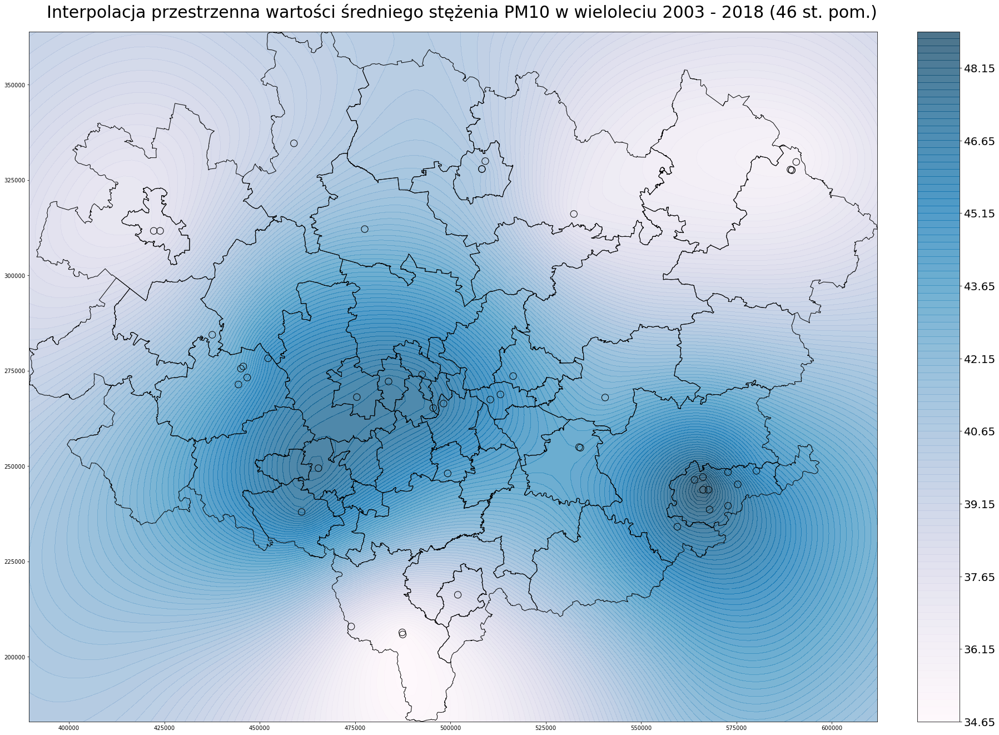

In [31]:
#Plot the spatial interpolation result with ordinary kriging using 'gaussian' variogram model

xintrp, yintrp = np.meshgrid(grid_lon, grid_lat) 
fig, ax = plt.subplots(figsize=(30,30))

boundarygeom = boundary.geometry

contour = plt.contourf(xintrp, yintrp, z1, len(z1), cmap=plt.cm.PuBu, alpha = 0.7)

#plot data, set point markers as empty inside ('o')
plt.scatter(PM10_lon2180, PM10_lat2180, marker='o', s=150, color='none', edgecolor='black')

npts = len(PM10_lon2180)

#title
plt.title('Interpolacja przestrzenna wartości średniego stężenia PM10 w wieloleciu 2003 - 2018 (%d st. pom.)' % npts, 
          fontsize = 30, loc ='right', pad = 25)

#set size of bar and legend
from mpl_toolkits.axes_grid1 import make_axes_locatable
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=1.0)
cb = plt.colorbar(contour, cax=cax)
cb.ax.tick_params(labelsize=20)   #set font size for colorbar

boundary.plot(ax=ax, facecolor='none', alpha = 1, linewidth=1.0, edgecolor='black', zorder = 5)

plt.xticks()
plt.yticks()

os.chdir(r'D:/DZEJNUS/NAUKA_20/Powietrze_GZM_i_okolice/python_wykresy')
plt.savefig('PM10_sr_wielolecie.png', dpi = 180)

plt.show()

[13.63683989 16.64563578 13.91345415  7.41067028 10.57010137 16.58948924
 10.48751216 13.0917287  14.64594369 10.9515485  12.77848499 26.77654782
  7.33885906 30.66526511 16.05031323 12.15435709  7.28488555  4.88550977
 35.00025423  9.73327702  7.22169047  9.4217917  21.42291482 12.58486777
 13.20272412 25.40967452 16.8328467  11.86228663 15.95591779 13.14239611
 10.56102838 14.68138276 12.00920378 20.58499661 11.96704629 17.88140123
 14.70633433 30.29541802 15.7455916  10.73391198  7.0519235  17.74062658
 18.51007788  9.68595314 12.13730696 12.85375315]
Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 2.412451591525708
Full Sill: 43.20771105361217
Range: 164785.69434322702
Nugget: 40.79525946208646 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...

[[14.12602416529682 14.12906769613803 14.132547592356342 ...
  13.895662663316632 13.898108913216161 13.900861346

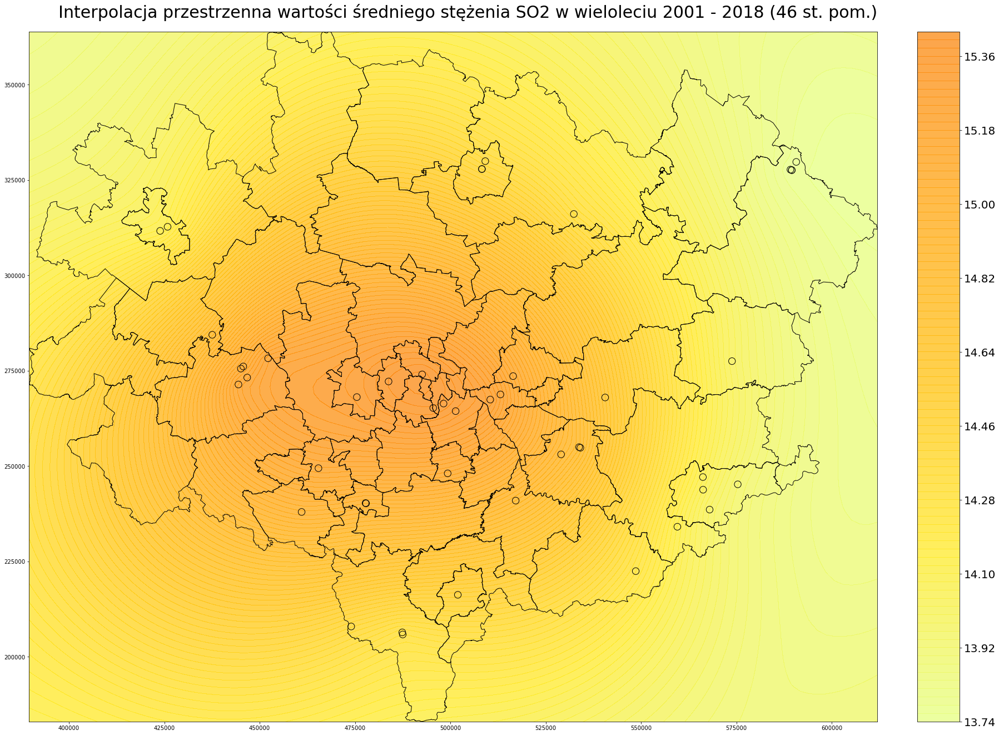

In [30]:
#converting data into numpy arrays - SO2
SO2_lon2180 = np.array(SO2_sr_wsp['lon_2180']) 
SO2_lat2180 = np.array(SO2_sr_wsp['lat_2180']) 
z_sr_SO2 = np.array(SO2_sr_wsp['sr_wielSO2'])
print (z_sr_SO2)

#Run the OrdinaryKriging method, the variogram_model is spherical
OK = OrdinaryKriging(SO2_lon2180, SO2_lat2180, z_sr_SO2, variogram_model='spherical', verbose=True, enable_plotting=False,nlags=20)
z2, ss2 = OK.execute('grid', grid_lon, grid_lat)
print (z2)

#Plot the spatial interpolation result with ordinary kriging using 'gaussian' variogram model

xintrp, yintrp = np.meshgrid(grid_lon, grid_lat) 
fig, ax = plt.subplots(figsize=(30,30))

boundarygeom = boundary.geometry

contour = plt.contourf(xintrp, yintrp, z2, len(z1), cmap=plt.cm.Wistia, alpha = 0.7)

#setting hollow points in the middle
plt.scatter(SO2_lon2180, SO2_lat2180, marker='o', s=150, color='none', edgecolor='black')

npts = len(SO2_lon2180)

#title
plt.title('Interpolacja przestrzenna wartości średniego stężenia SO2 w wieloleciu 2001 - 2018 (%d st. pom.)' % npts, 
          fontsize = 30, loc ='right', pad = 25)

#setting the size of the legend bar
from mpl_toolkits.axes_grid1 import make_axes_locatable
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=1.0)
cb = plt.colorbar(contour, cax=cax)
cb.ax.tick_params(labelsize=20)

boundary.plot(ax=ax, facecolor='none', alpha = 1, linewidth=1.0, edgecolor='black', zorder = 5)

plt.xticks()
plt.yticks()

os.chdir(r'D:/DZEJNUS/NAUKA_20/Powietrze_GZM_i_okolice/python_wykresy')
plt.savefig('SO2_sr_wielolecie.png', dpi = 180)

plt.show()

[17.76587477 65.78746459 31.03774328 29.12859044 42.4527885  33.93264496
 22.31475798 23.40357101 18.26316286 21.46266264 16.82962578 19.38413591
 12.83843225 23.53234343 21.90395341 15.81543294 22.47834675 17.15745468
 10.35233058 12.70457827 14.35082384 13.57979665 23.4570335  32.36145872
 26.32609164 46.59749733 16.01818269 34.28428406 37.49396179 20.74054718
 28.77387816 24.74894822 30.55482841 55.38235057 23.15630346 26.48768624
 42.26855914 24.05169397 12.61161762 13.7129685  22.6579344  25.32780274
  9.96361498 20.23084992]
Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 46.71002690462957
Full Sill: 125.43683602350386
Range: 91799.3168196677
Nugget: 78.72680911887429 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...

[[22.998861666732573 22.992952587507272 22.98469141378089 ...
  23.711224597121955 23.631007017339883 23.550472036262576]
 [22.99796190342

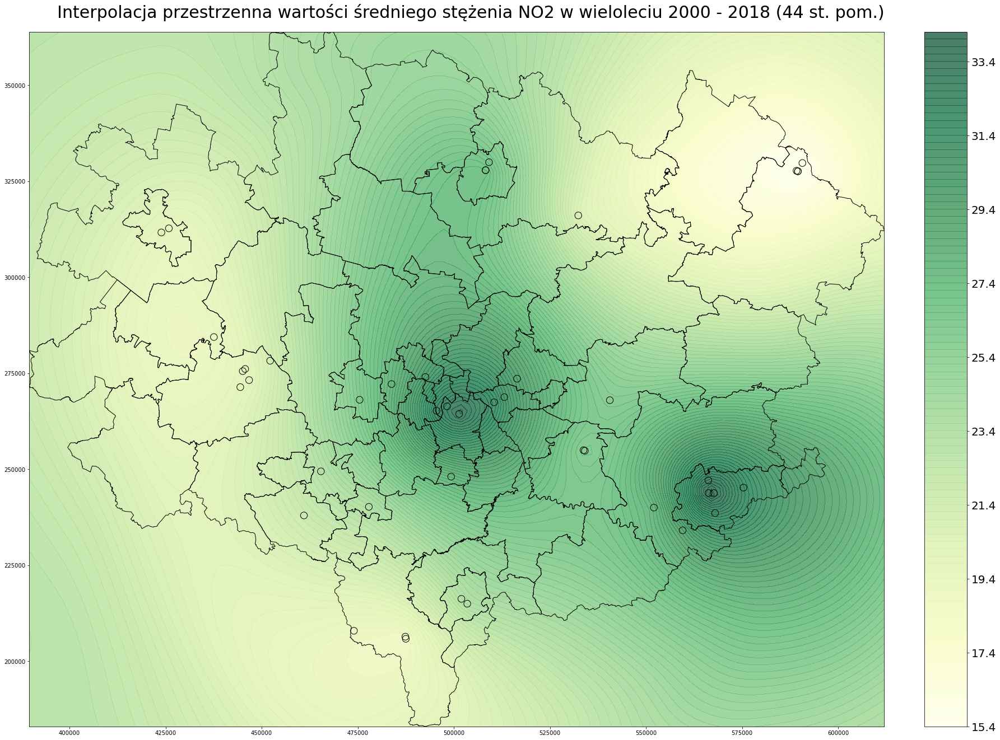

In [29]:
#converting data into numpy arrays - NO2
NO2_lon2180 = np.array(NO2_sr_wsp['lon_2180']) 
NO2_lat2180 = np.array(NO2_sr_wsp['lat_2180']) 
z_sr_NO2 = np.array(NO2_sr_wsp['sr_wielNO2'])
print (z_sr_NO2)

#Run the OrdinaryKriging method, the variogram_model is spherical
OK = OrdinaryKriging(NO2_lon2180, NO2_lat2180, z_sr_NO2, variogram_model='spherical', verbose=True, enable_plotting=False,nlags=20)
z3, ss2 = OK.execute('grid', grid_lon, grid_lat)
print (z3)

#Plot the spatial interpolation result with ordinary kriging using 'gaussian' variogram model

xintrp, yintrp = np.meshgrid(grid_lon, grid_lat) 
fig, ax = plt.subplots(figsize=(30,30))

boundarygeom = boundary.geometry

contour = plt.contourf(xintrp, yintrp, z3, len(z1), cmap=plt.cm.YlGn, alpha = 0.7)

plt.scatter(NO2_lon2180, NO2_lat2180, marker='o', s=150, color='none', edgecolor='black')

npts = len(NO2_lon2180)

plt.title('Interpolacja przestrzenna wartości średniego stężenia NO2 w wieloleciu 2000 - 2018 (%d st. pom.)' % npts, 
          fontsize = 30, loc ='right', pad = 25)

from mpl_toolkits.axes_grid1 import make_axes_locatable
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=1.0)
cb = plt.colorbar(contour, cax=cax)
cb.ax.tick_params(labelsize=20)


boundary.plot(ax=ax, facecolor='none', alpha = 1, linewidth=1.0, edgecolor='black', zorder = 5)

plt.xticks()
plt.yticks()

os.chdir(r'D:/DZEJNUS/NAUKA_20/Powietrze_GZM_i_okolice/python_wykresy')
plt.savefig('NO2_sr_wielolecie.png', dpi = 180)

plt.show()

In [17]:
#INTERPOLACJA DLA WSZYSTKICH LAT - PĘTLA!

In [18]:
PM10_kol_lata = [i for i in PM10_sr_wsp.columns if i.startswith('srPM1')]
PM10_kol_lata

['srPM1_2003',
 'srPM1_2004',
 'srPM1_2005',
 'srPM1_2006',
 'srPM1_2007',
 'srPM1_2008',
 'srPM1_2009',
 'srPM1_2010',
 'srPM1_2011',
 'srPM1_2012',
 'srPM1_2013',
 'srPM1_2014',
 'srPM1_2015',
 'srPM1_2016',
 'srPM1_2017',
 'srPM1_2018']

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 158.17776642151256
Full Sill: 240.94181919091085
Range: 72586.55827746169
Nugget: 82.76405276939829 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



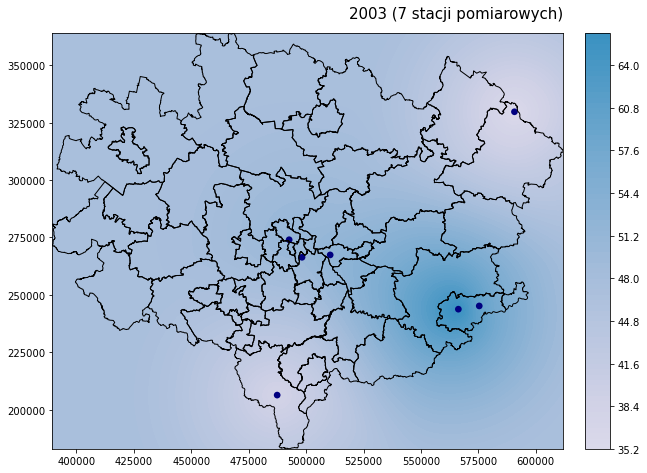

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 220.1126341730276
Full Sill: 220.1126341730276
Range: 151118.78189102488
Nugget: 1.42233860356127e-29 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



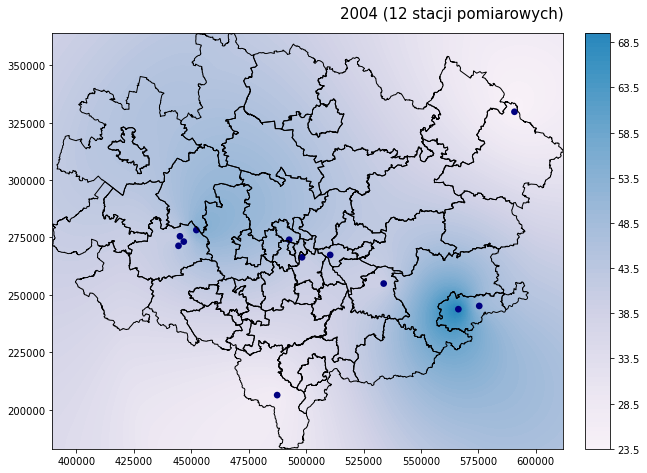

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 261.01701203113595
Full Sill: 261.01701203113595
Range: 114722.54736656179
Nugget: 2.2551838288602427e-24 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



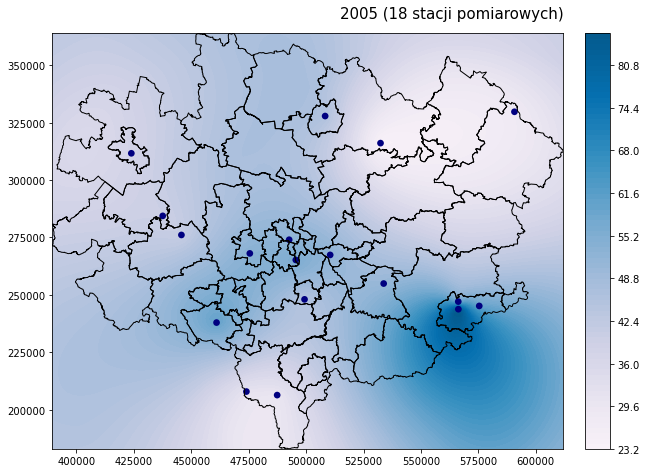

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 381.65586106637494
Full Sill: 381.6558610663751
Range: 148151.08316734462
Nugget: 1.4355853457354668e-13 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



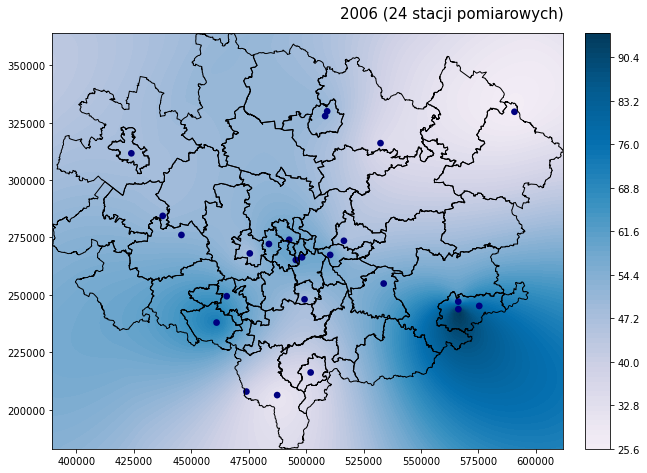

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 301.6090399010405
Full Sill: 304.99912129781507
Range: 163282.55862332298
Nugget: 3.3900813967745558 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



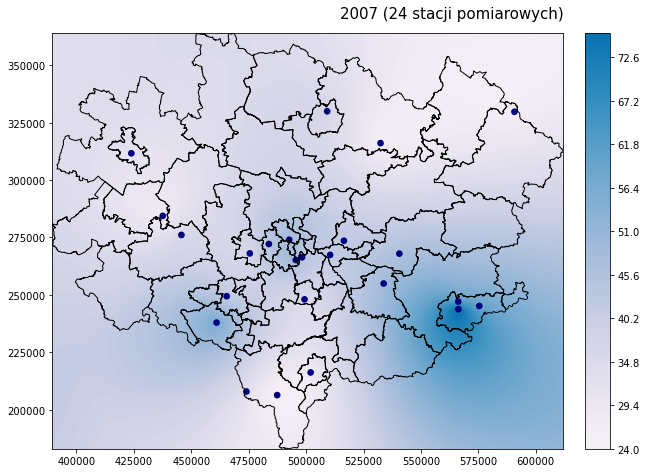

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 328.9344067951484
Full Sill: 366.6976458068976
Range: 161568.9473792994
Nugget: 37.76323901174921 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



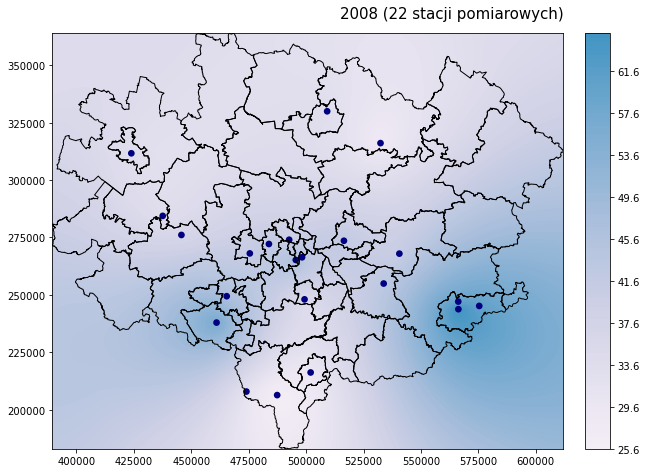

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 238.99482401352705
Full Sill: 239.88476022439875
Range: 161568.947379224
Nugget: 0.889936210871692 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



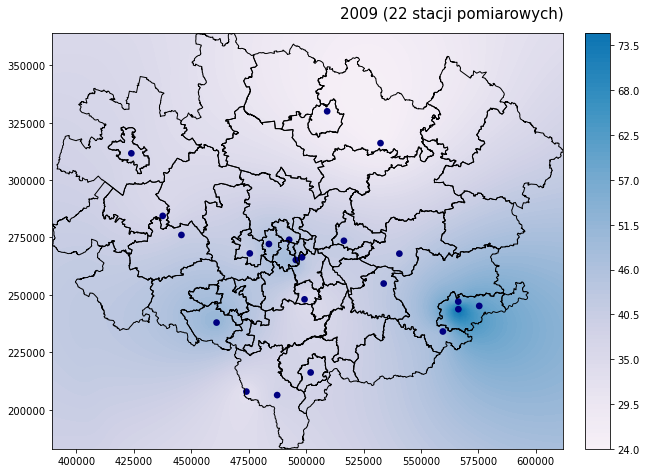

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 258.35626161894726
Full Sill: 412.91227171949964
Range: 161568.4283852621
Nugget: 154.55601010055238 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



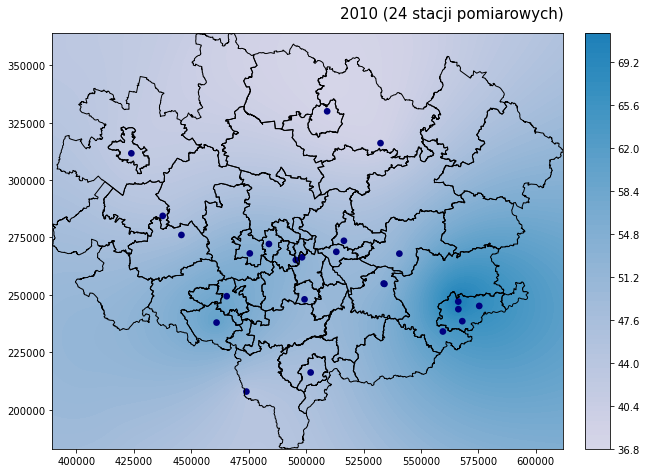

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 134.8071341496915
Full Sill: 190.40522342197144
Range: 63986.63330519865
Nugget: 55.59808927227994 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



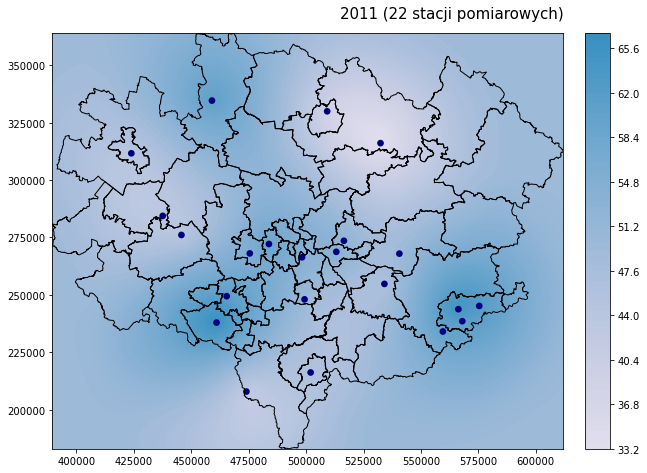

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 128.81440443486332
Full Sill: 159.62679947118676
Range: 164928.98912219182
Nugget: 30.812395036323437 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



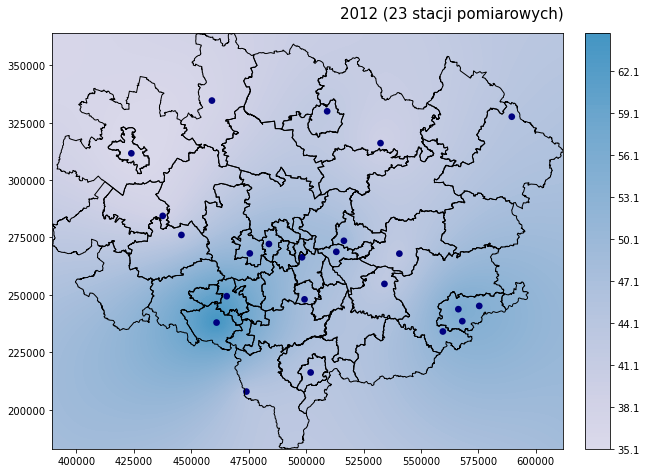

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 30.234687175795358
Full Sill: 91.47844223177964
Range: 85394.9423788756
Nugget: 61.24375505598429 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



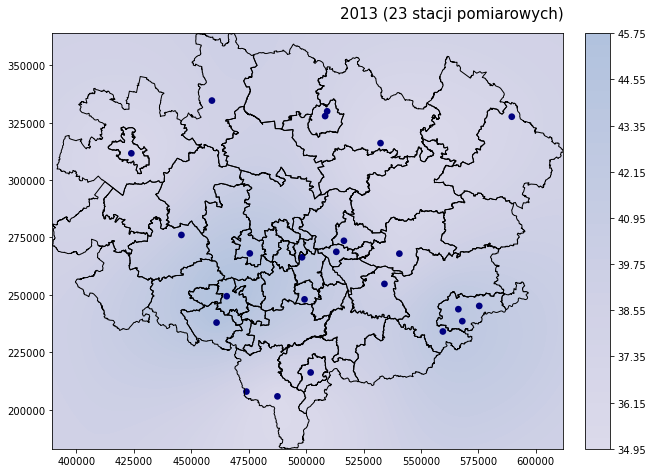

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 38.49927447817999
Full Sill: 86.53244600298507
Range: 90698.82207943598
Nugget: 48.03317152480507 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



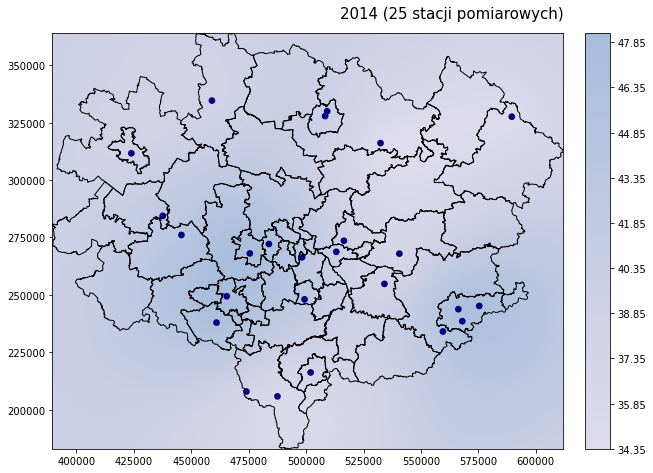

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 38.49927447817999
Full Sill: 86.53244600298507
Range: 90698.82207943598
Nugget: 48.03317152480507 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



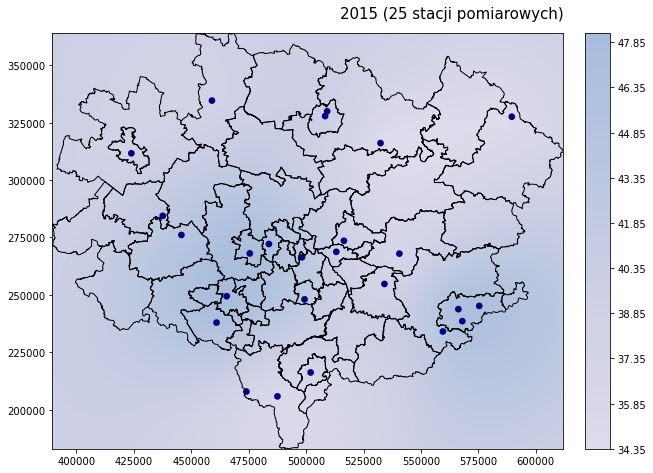

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 27.001848940011204
Full Sill: 60.79494387992635
Range: 84361.91924814522
Nugget: 33.79309493991515 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



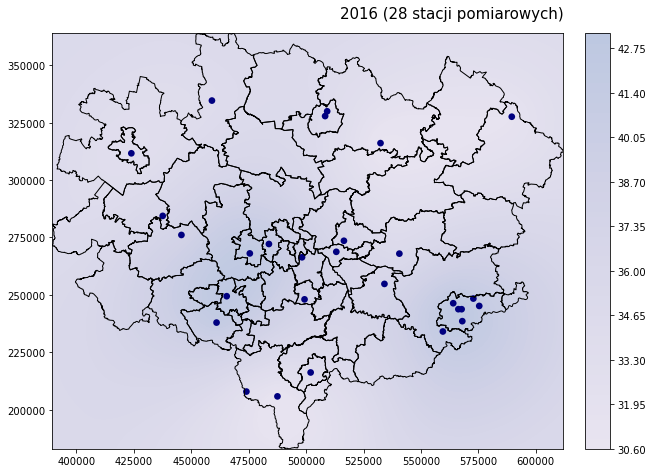

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 18.827221752329297
Full Sill: 42.353216652312724
Range: 43745.296500155535
Nugget: 23.525994899983424 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



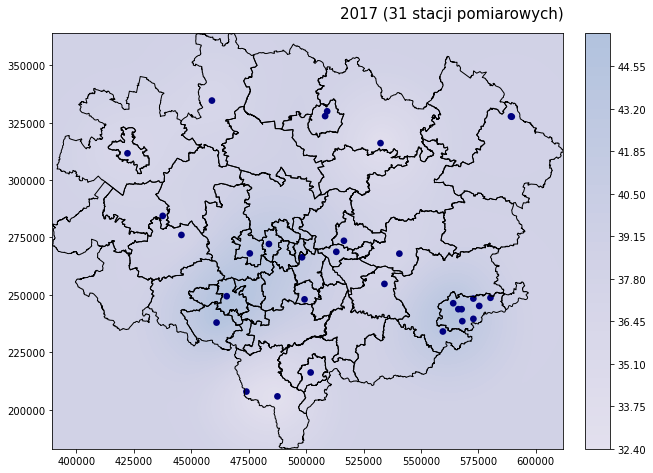

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 6.81160331627781
Full Sill: 45.842829000878666
Range: 105048.56030515
Nugget: 39.031225684600855 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



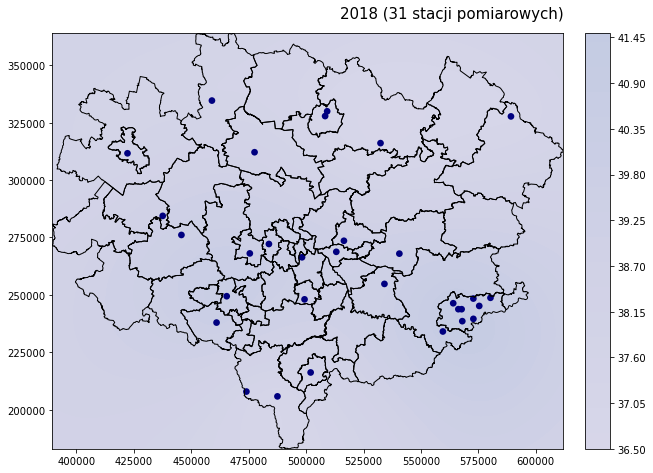

In [57]:
#interpolation of PM10 values for all years

PM10_kol_lata = [i for i in PM10_sr_wsp.columns if i.startswith('srPM1')] #iterate through years

for dane in PM10_kol_lata:
    PM10_intrp = PM10_sr_wsp.loc[:, [dane, 'Kod stacji', 'lon_2180', 'lat_2180']]
    PM10_intrp.dropna(axis = 0, inplace = True)
    z_sr_PM10 = np.array(PM10_intrp[dane])
    lon2180 = np.array(PM10_intrp['lon_2180'])
    lat2180 = np.array(PM10_intrp['lat_2180'])
    OK = OrdinaryKriging(lon2180, lat2180, z_sr_PM10, variogram_model='spherical', verbose=True, enable_plotting=False,nlags=20)
    z, ss = OK.execute('grid', grid_lon, grid_lat)
    xintrp, yintrp = np.meshgrid(grid_lon, grid_lat) 
    
    fig, ax = plt.subplots(figsize=(10,10))

    boundarygeom = boundary.geometry
    
    contour = plt.contourf(xintrp, yintrp, z, len(z), cmap=plt.cm.PuBu, alpha = 1, vmin = 20.0, vmax = 95.0)
    #vmin and vmax cause the limits of the color palette to be set and made uniform for all maps
    
    #set markers
    plt.scatter(lon2180, lat2180, s=45, color='navy', edgecolor='none')

    npts = len(lon2180)


    plt.title(str(dane[6:10])+' (%d stacji pomiarowych)' % npts, 
            fontsize = 15, loc ='right', pad = 15)


    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.3)
    plt.colorbar(contour, cax=cax)

    boundary.plot(ax=ax, facecolor='none', alpha = 1, linewidth=1.0, edgecolor='black', zorder = 5)

    plt.xticks()
    plt.yticks()

    os.chdir(r'D:/DZEJNUS/NAUKA_20/Powietrze_GZM_i_okolice/python_wykresy/intrp_PM10')
    plt.savefig(dane+'.png', dpi = 180)

    plt.show()

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 165.40913230403945
Full Sill: 165.40913230584636
Range: 80001.95735374054
Nugget: 1.8069125251623424e-09 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



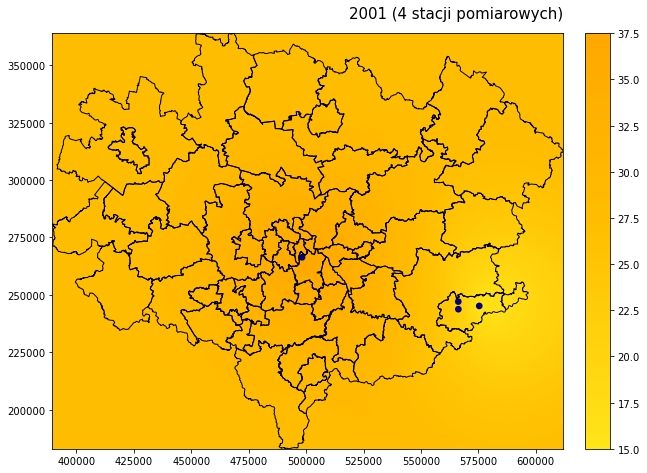

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 171.9162908858981
Full Sill: 171.9162908858981
Range: 68266.83014227187
Nugget: 9.04286966617318e-15 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



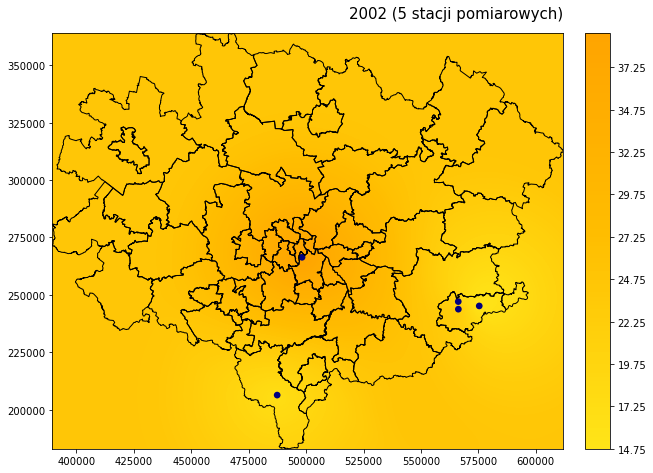

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 138.0981276671057
Full Sill: 138.0981276671057
Range: 83509.5894238543
Nugget: 5.142351647117403e-18 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



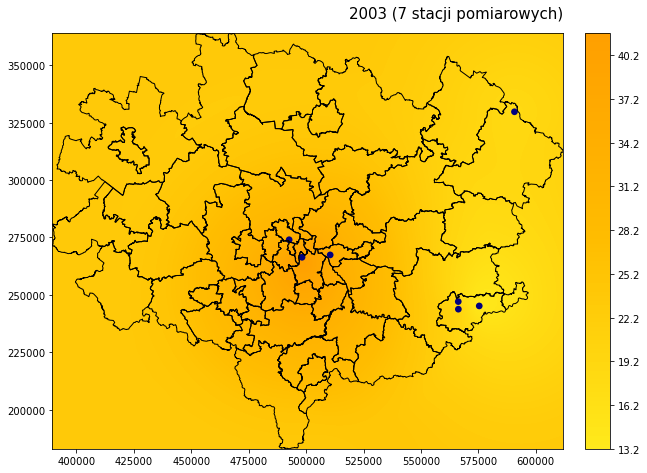

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 158.75294713853302
Full Sill: 158.75294714028848
Range: 35462.01930548785
Nugget: 1.7554546537683024e-09 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



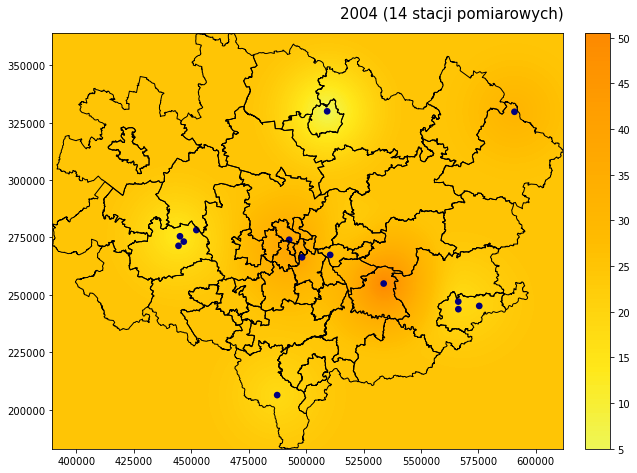

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 1.4085028119295212e-14
Full Sill: 130.59940096068095
Range: 135545.06941849476
Nugget: 130.59940096068095 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



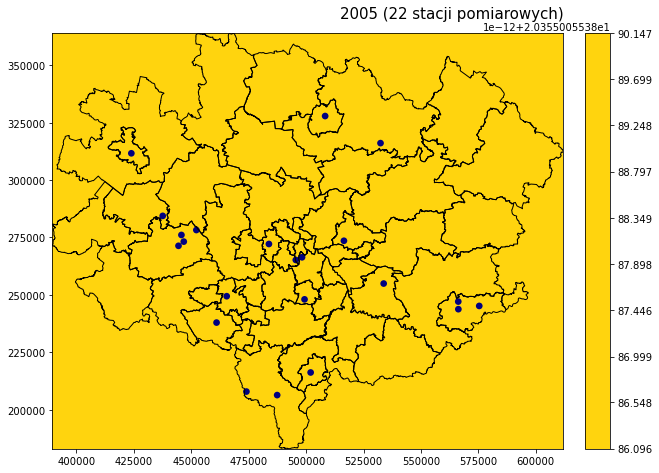

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 44.48550889420042
Full Sill: 49.963775989318364
Range: 59030.78045117063
Nugget: 5.478267095117945 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



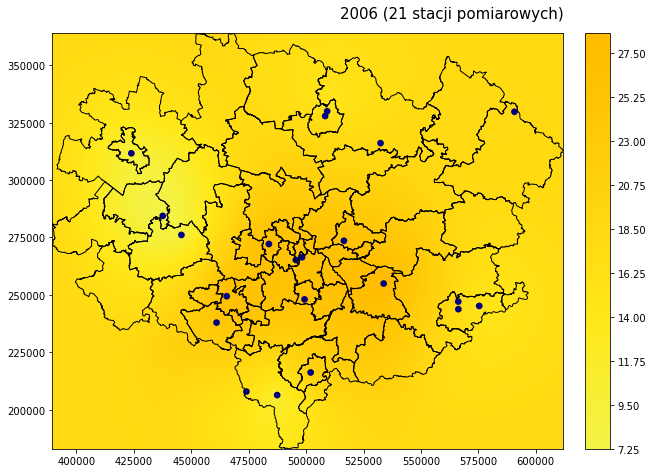

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 18.64579900233903
Full Sill: 18.645799002339327
Range: 55591.06426568701
Nugget: 2.974005048864243e-13 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



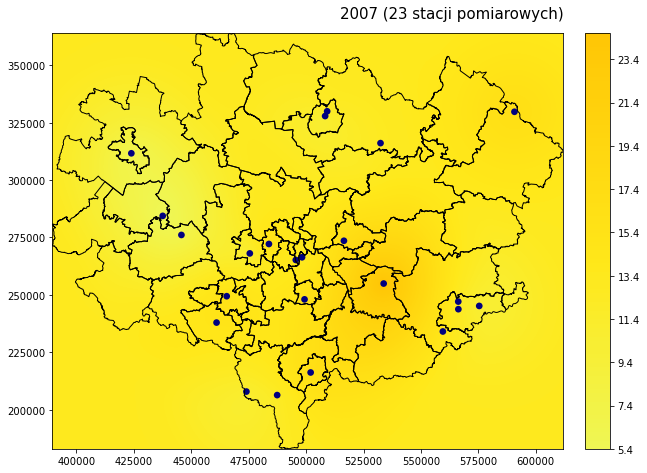

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 16.76899594024733
Full Sill: 16.768995940253273
Range: 51043.43611370472
Nugget: 5.94374391438471e-12 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



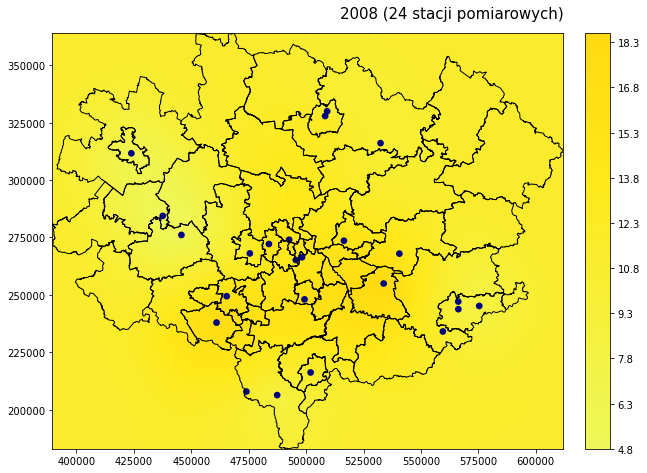

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 22.6320072794543
Full Sill: 22.91021513538705
Range: 32951.35527405026
Nugget: 0.2782078559327471 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



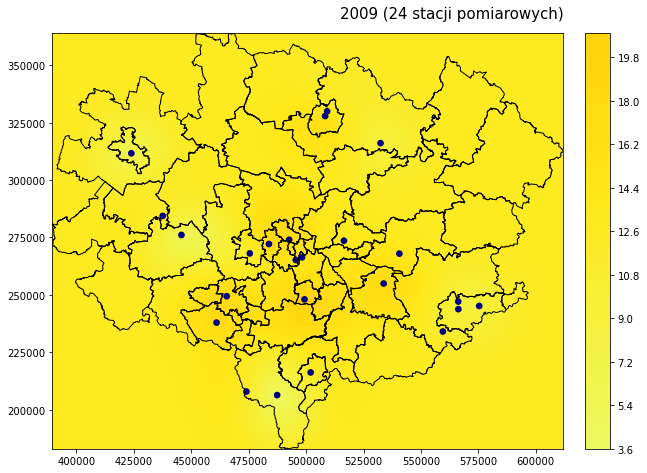

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 11.968711723607397
Full Sill: 29.722675775288785
Range: 141058.90719120135
Nugget: 17.753964051681386 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



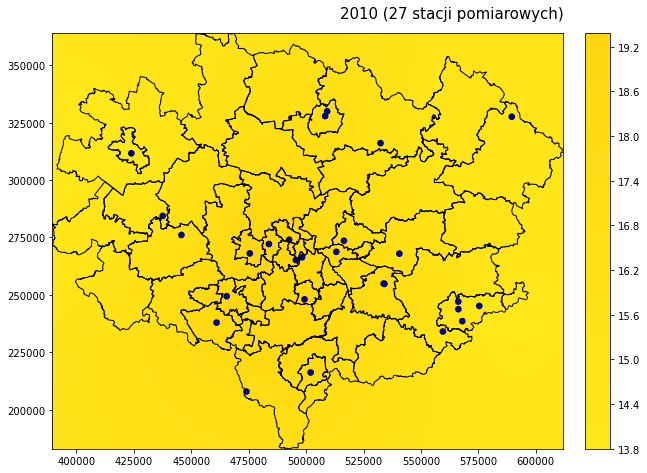

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 11.498708105798114
Full Sill: 15.445341252839047
Range: 90117.61479839537
Nugget: 3.946633147040933 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



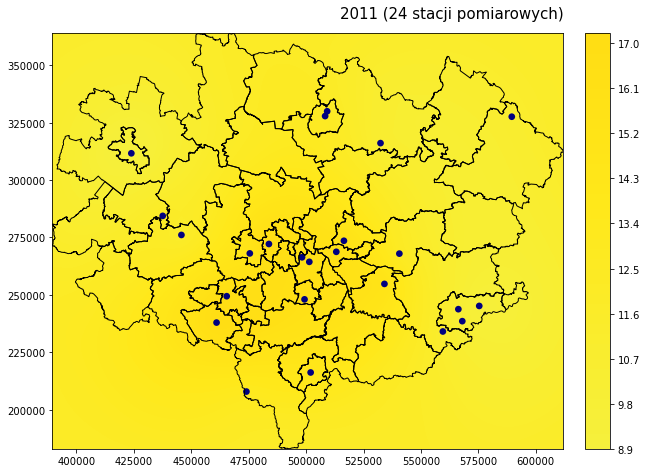

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 10.061142477120589
Full Sill: 11.953636773838202
Range: 53170.19260566169
Nugget: 1.8924942967176128 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



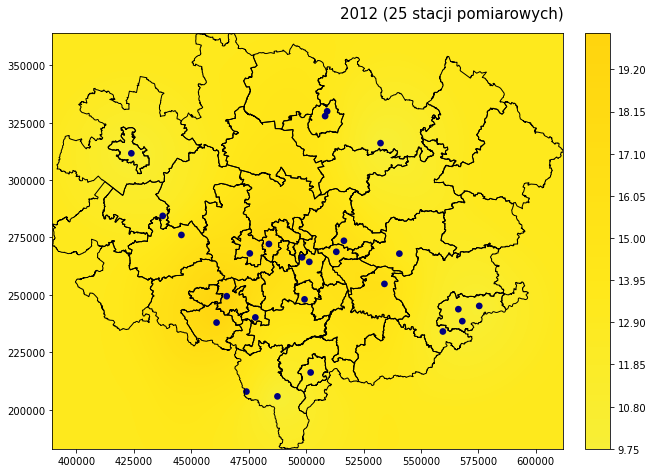

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 8.429818944273261
Full Sill: 9.326374099518679
Range: 67146.88393220292
Nugget: 0.8965551552454175 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



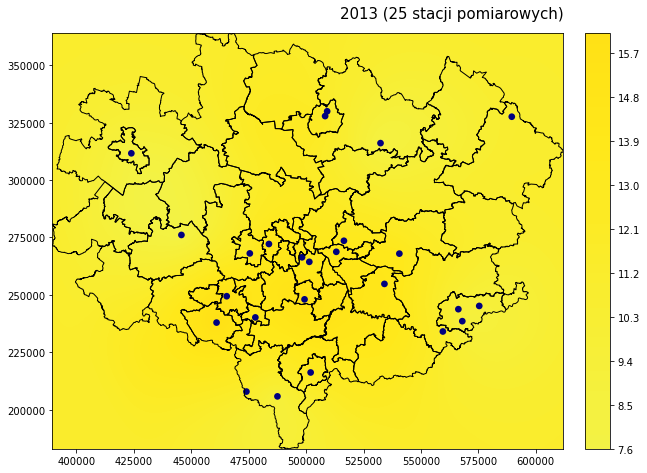

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 5.906112789753358
Full Sill: 8.63032887509553
Range: 61108.61443722594
Nugget: 2.724216085342173 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



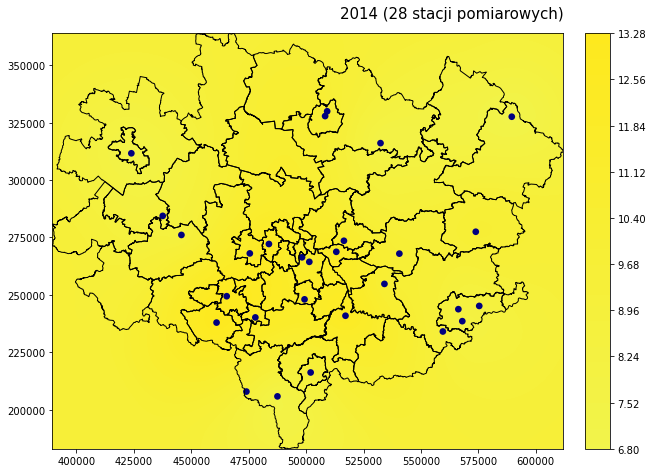

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 5.906112789753358
Full Sill: 8.63032887509553
Range: 61108.61443722594
Nugget: 2.724216085342173 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



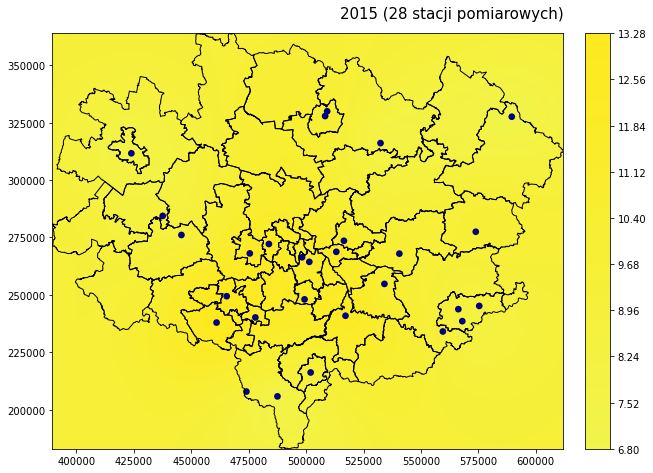

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 9.891438275381415
Full Sill: 11.488731899433052
Range: 67778.2960026391
Nugget: 1.5972936240516373 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



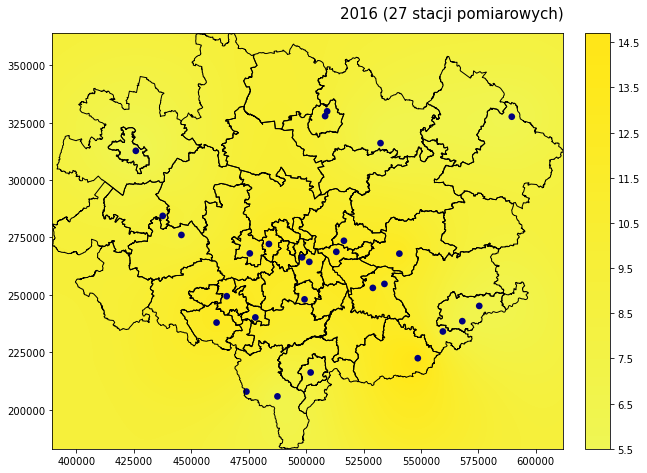

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 7.930889520562063
Full Sill: 7.930889520562063
Range: 51406.742139463735
Nugget: 6.588941414583914e-19 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



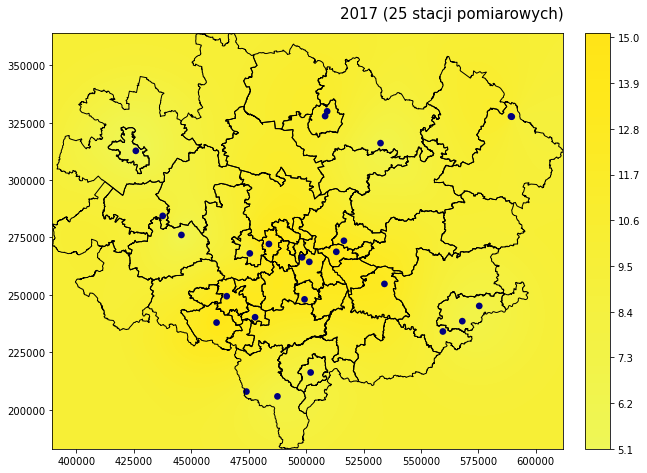

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 4.745448204241522
Full Sill: 5.879869023900008
Range: 73405.93399681855
Nugget: 1.1344208196584866 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



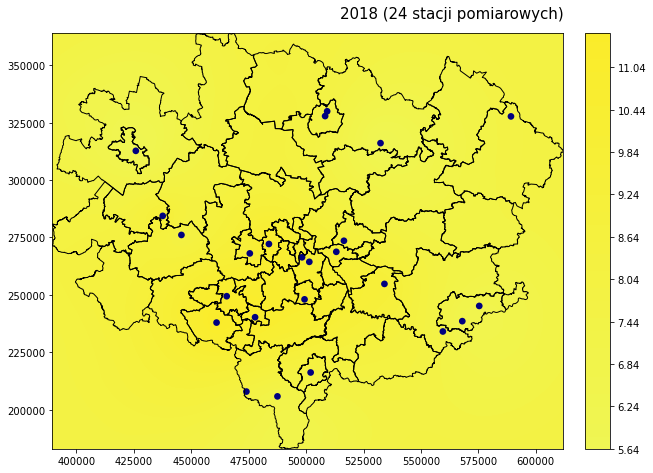

In [55]:
#interpolation of SO2 values for all years

SO2_kol_lata = [i for i in SO2_sr_wsp.columns if i.startswith('srSO2')]

for dane in SO2_kol_lata:
    SO2_intrp = SO2_sr_wsp.loc[:, [dane, 'Kod stacji', 'lon_2180', 'lat_2180']]
    SO2_intrp.dropna(axis = 0, inplace = True)
    z_sr_SO2 = np.array(SO2_intrp[dane])
    lon2180 = np.array(SO2_intrp['lon_2180'])
    lat2180 = np.array(SO2_intrp['lat_2180'])
    OK = OrdinaryKriging(lon2180, lat2180, z_sr_SO2, variogram_model='spherical', verbose=True, enable_plotting=False,nlags=20)
    z1, ss1 = OK.execute('grid', grid_lon, grid_lat)
    xintrp, yintrp = np.meshgrid(grid_lon, grid_lat) 
    
    fig, ax = plt.subplots(figsize=(10,10))

    boundarygeom = boundary.geometry
    
    contour = plt.contourf(xintrp, yintrp, z1, len(z1), cmap=plt.cm.Wistia, alpha =1, vmin = 0.0, vmax = 55.0)

    

    plt.scatter(lon2180, lat2180, s=45, color='navy', edgecolor='none')

    npts = len(lon2180)


    plt.title(str(dane[6:10])+' (%d stacji pomiarowych)' % npts, 
            fontsize = 15, loc ='right', pad = 15)


    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.3)
    plt.colorbar(contour, cax=cax)

    boundary.plot(ax=ax, facecolor='none', alpha = 1, linewidth=1.0, edgecolor='black', zorder = 5)

    plt.xticks()
    plt.yticks()

    os.chdir(r'D:/DZEJNUS/NAUKA_20/Powietrze_GZM_i_okolice/python_wykresy/intrp_SO2')
    plt.savefig(dane+'.png', dpi = 180)

    plt.show()

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 3.1898904532003807e-122
Full Sill: 173.2766999626159
Range: 87577.40635851318
Nugget: 173.2766999626159 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



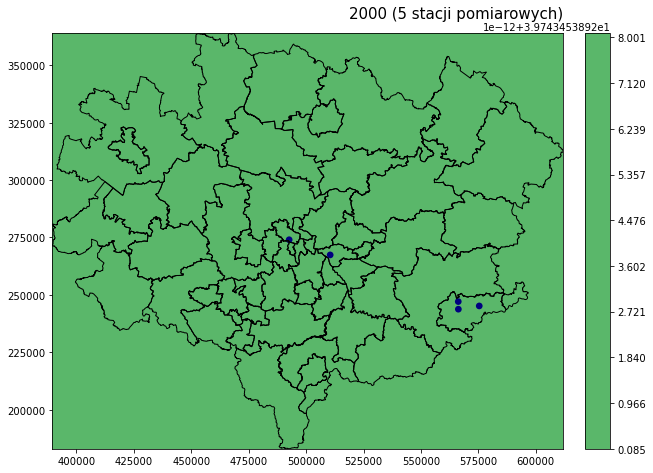

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 8.37774236152045e-55
Full Sill: 174.1604265466471
Range: 87626.82649565968
Nugget: 174.1604265466471 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



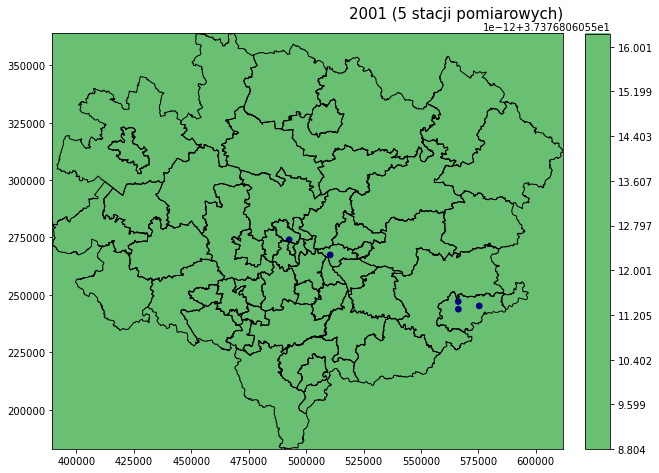

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 1.3513992641753237e-10
Full Sill: 337.20011930444673
Range: 96159.6049022254
Nugget: 337.2001193043116 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



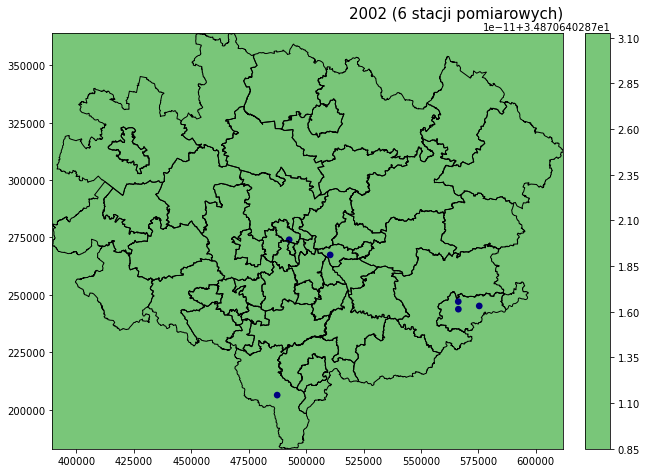

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 252.19870984250446
Full Sill: 276.14545060473324
Range: 1310.1339560464949
Nugget: 23.946740762228796 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



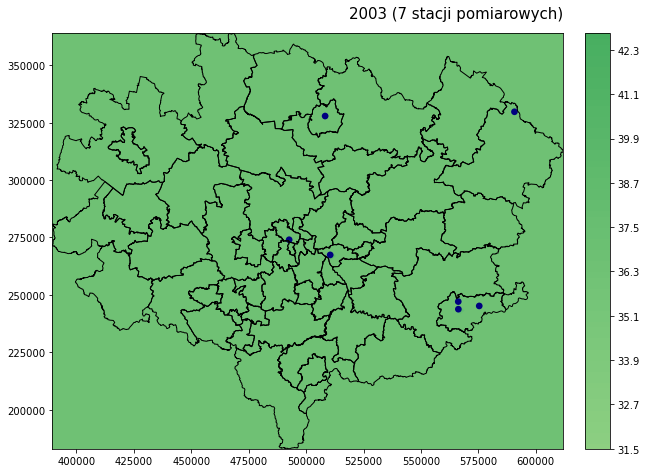

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 8.944349181326458e-46
Full Sill: 104.79356305846768
Range: 132105.51044164595
Nugget: 104.79356305846768 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



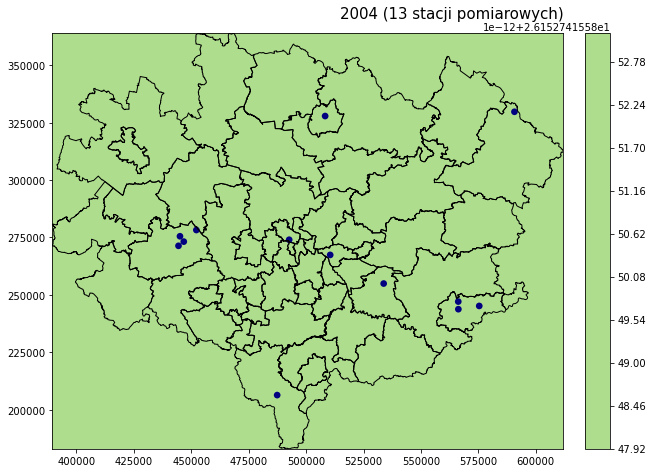

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 116.5795371746237
Full Sill: 154.635959078104
Range: 107773.76197077036
Nugget: 38.05642190348031 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



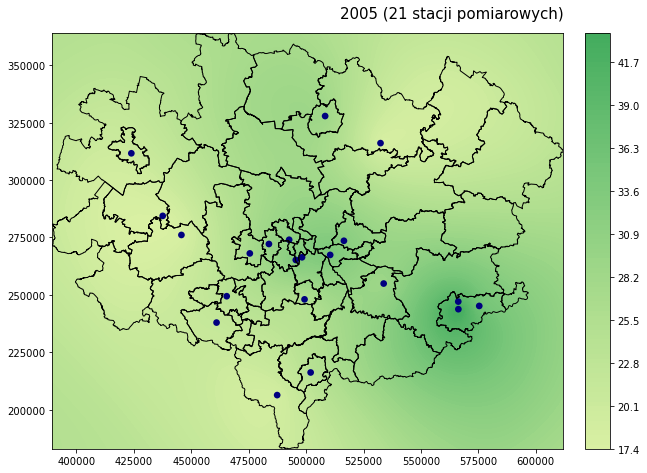

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 111.0386592444161
Full Sill: 185.22478689767476
Range: 154391.5164581561
Nugget: 74.18612765325867 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



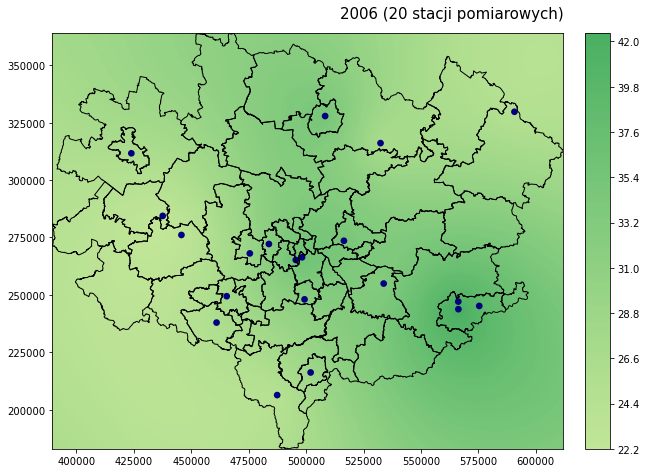

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 48.03889061256759
Full Sill: 156.33092436494226
Range: 135282.56975636454
Nugget: 108.29203375237466 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



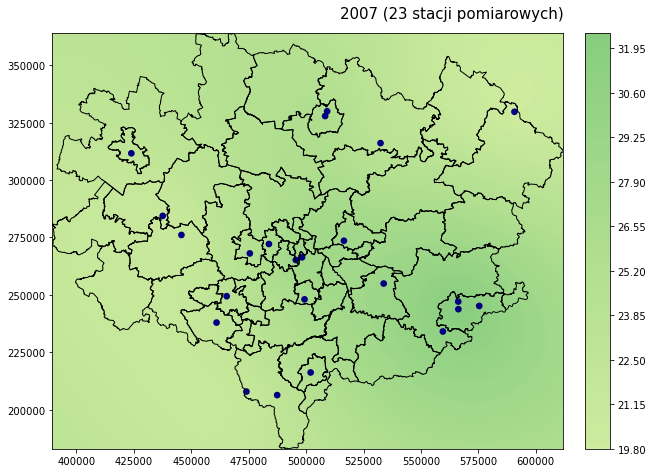

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 41.72638129438244
Full Sill: 152.71860836317413
Range: 161568.9473793118
Nugget: 110.99222706879169 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



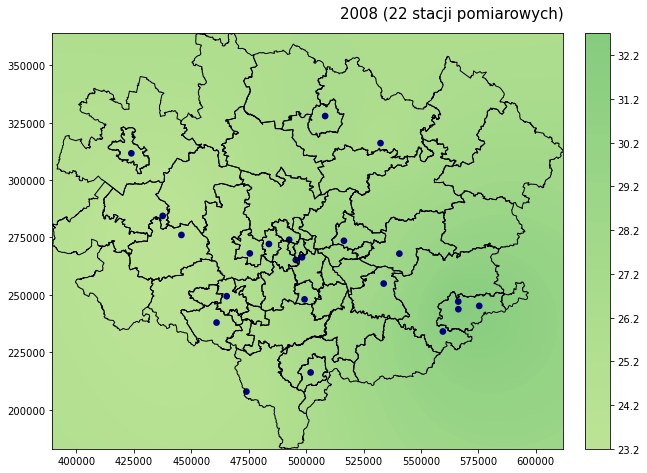

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 64.42505705452885
Full Sill: 188.09909857100092
Range: 141730.80244239327
Nugget: 123.67404151647207 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



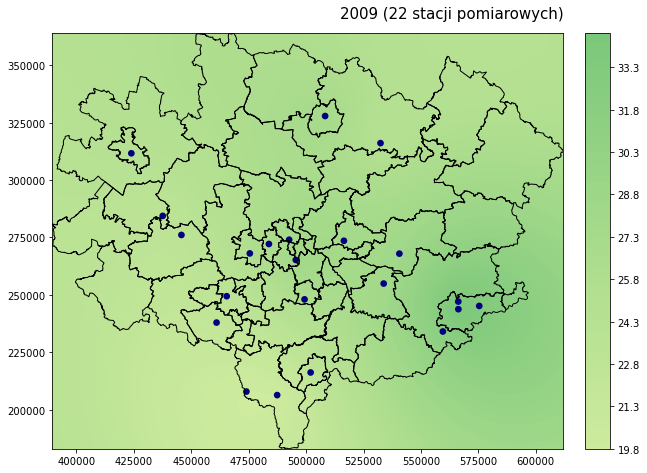

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 5.975260858911806e-09
Full Sill: 128.8137677647065
Range: 161702.62885043595
Nugget: 128.81376775873125 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



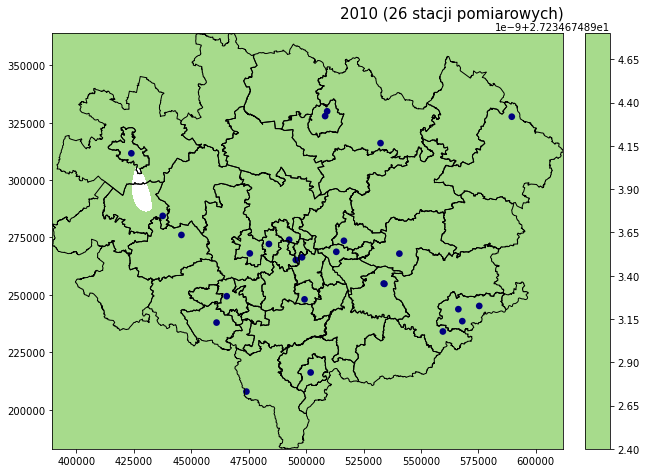

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 38.81535431836364
Full Sill: 199.8778286322295
Range: 161568.42838299868
Nugget: 161.06247431386586 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



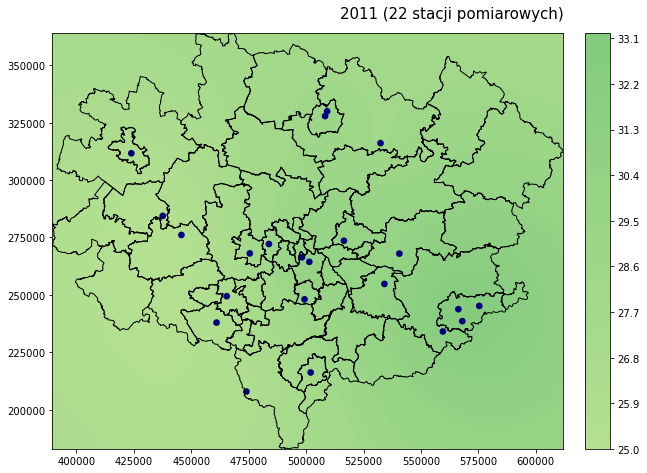

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 66.56800298550854
Full Sill: 176.19413098112074
Range: 161568.42838526188
Nugget: 109.6261279956122 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



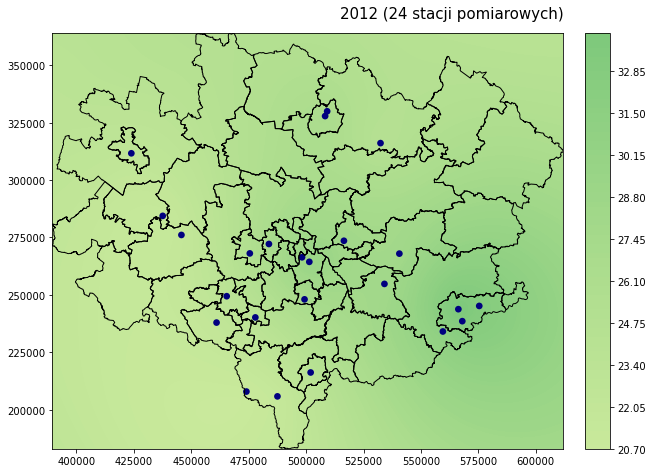

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 4.075516901945571e-09
Full Sill: 131.57953628581362
Range: 108974.33322107892
Nugget: 131.5795362817381 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



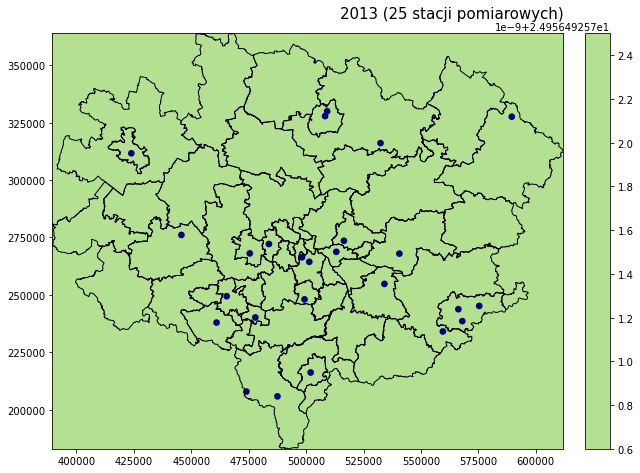

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 7.378941864710631e-12
Full Sill: 133.2733382383817
Range: 97577.06077431342
Nugget: 133.27333823837432 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



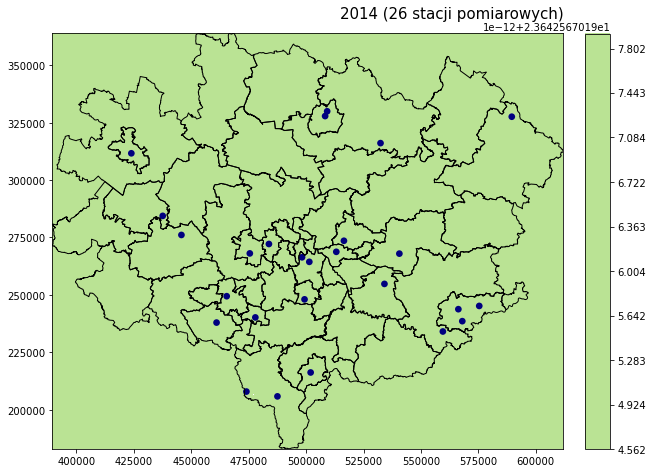

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 7.378941864710631e-12
Full Sill: 133.2733382383817
Range: 97577.06077431342
Nugget: 133.27333823837432 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



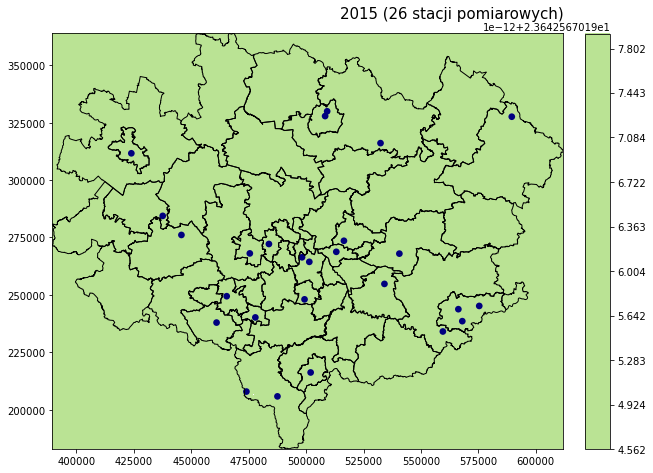

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'spherical' Variogram Model
Partial Sill: 6.181989741853936e-13
Full Sill: 140.46383412676136
Range: 128675.50991734487
Nugget: 140.46383412676073 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



ValueError: Contour levels must be increasing

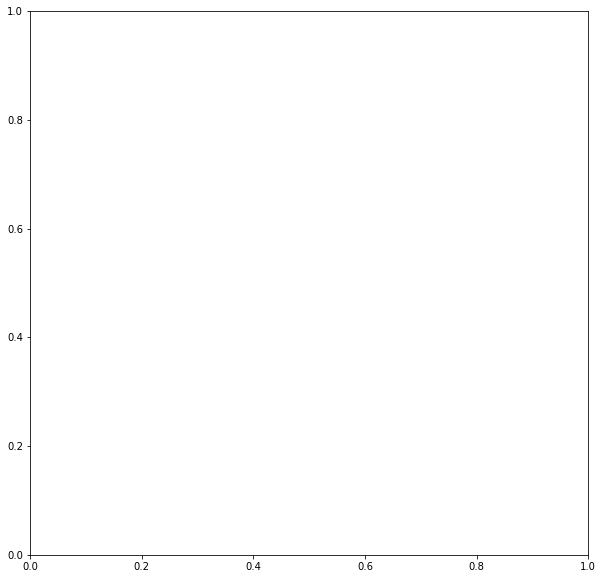

In [58]:
#interpolation of NO2 values for all years

NO2_kol_lata = [i for i in NO2_sr_wsp.columns if i.startswith('srNO2')]

for dane in NO2_kol_lata:
    NO2_intrp = NO2_sr_wsp.loc[:, [dane, 'Kod stacji', 'lon_2180', 'lat_2180']]
    NO2_intrp.dropna(axis = 0, inplace = True)
    z_sr_NO2 = np.array(NO2_intrp[dane])
    lon2180 = np.array(NO2_intrp['lon_2180'])
    lat2180 = np.array(NO2_intrp['lat_2180'])
    OK = OrdinaryKriging(lon2180, lat2180, z_sr_NO2, variogram_model='spherical', verbose=True, enable_plotting=False,nlags=20)
    z2, ss = OK.execute('grid', grid_lon, grid_lat)
    xintrp, yintrp = np.meshgrid(grid_lon, grid_lat) 
    
    fig, ax = plt.subplots(figsize=(10,10))

    boundarygeom = boundary.geometry
    
    contour = plt.contourf(xintrp, yintrp, z2, len(z2), cmap=plt.cm.YlGn, alpha = 1, vmin = 0.0, vmax = 70.0)

    

    plt.scatter(lon2180, lat2180, s=45, color='navy', edgecolor='none')

    npts = len(lon2180)


    plt.title(str(dane[6:10])+' (%d stacji pomiarowych)' % npts, 
            fontsize = 15, loc ='right', pad = 15)


    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.3)
    plt.colorbar(contour, cax=cax)

    boundary.plot(ax=ax, facecolor='none', alpha = 1, linewidth=1.0, edgecolor='black', zorder = 5)

    plt.xticks()
    plt.yticks()

    os.chdir(r'D:/DZEJNUS/NAUKA_20/Powietrze_GZM_i_okolice/python_wykresy/intrp_NO2')
    plt.savefig(dane+'.png', dpi = 180)

    plt.show()